# Part 1
Preprocess

In [29]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

In [30]:
def get_surrounding_pixels(image, x, y):
    height, width = image.shape[:2]
    x_start = max(0, x - 1)
    x_end = min(width, x + 2)
    y_start = max(0, y - 1)
    y_end = min(height, y + 2)
    return image[y_start:y_end, x_start:x_end]

In [31]:
def find_equivalent_pixels(original_image, resized_image):
    inputs = []
    labels = []
    height_ratio = original_image.shape[0] / resized_image.shape[0]
    width_ratio = original_image.shape[1] / resized_image.shape[1]

    for y in range(original_image.shape[0]):
        for x in range(original_image.shape[1]):
            resized_x = int(x / width_ratio)
            resized_y = int(y / height_ratio)

            surrounding_pixels = get_surrounding_pixels(resized_image, resized_x, resized_y)  

            input_vector = surrounding_pixels.flatten()
            label_vector = original_image[y, x]

            if input_vector.size == 27 and label_vector.size == 3:
                inputs.append(input_vector)
                labels.append(label_vector)
            else:
                avg_input_vec = np.average(input_vector)
                input_vector = np.pad(input_vector, (0, 27 - input_vector.size),  mode='constant', constant_values=avg_input_vec)  # Pad to length 27
                inputs.append(input_vector)
                labels.append(label_vector)

    return inputs, labels

In [32]:
def main_data_preprocessing(original_images, resized_images):
    all_inputs = []
    all_labels = []
    
    for original_image, resized_image in zip(original_images, resized_images):
        inputs, labels = find_equivalent_pixels(original_image, resized_image)
        all_inputs.extend(inputs)
        all_labels.extend(labels)
    
    return all_inputs, all_labels

In [43]:
original_images_training = [cv2.imread(f"init_images/image_{i}.jpg") for i in range(1, 8)]
resized_images_trining = [cv2.imread(f"reduced_resolution_images/image_{i}.jpg") for i in range(1, 8)]

original_images_validation = [cv2.imread(f"init_images/image_{i}.jpg") for i in range(8, 9)]
resized_images_validation = [cv2.imread(f"reduced_resolution_images/image_{i}.jpg") for i in range(8, 9)]

original_images_test = [cv2.imread(f"init_images/image_{i}.jpg") for i in range(9, 11)]
resized_images_test = [cv2.imread(f"reduced_resolution_images/image_{i}.jpg") for i in range(9, 11)]

train_inputs, train_labels = main_data_preprocessing(original_images_training, resized_images_trining)
val_inputs, val_labels = main_data_preprocessing(original_images_validation, resized_images_validation)
test_inputs, test_labels = main_data_preprocessing(original_images_test, resized_images_test)

print(f"Number of input vectors: {len(train_inputs)}")
print(f"Number of label vectors: {len(train_labels)}")

Number of input vectors: 773600
Number of label vectors: 773600


# Part 2 
models 

Creating the MLP for Super-Resolution!

In [12]:
# Test 1
import tensorflow as tf

multi_layer_perceptron1 = tf.keras.models.Sequential([
    tf.keras.layers.Dense(3, activation='relu', input_shape=(27,)),
    tf.keras.layers.Dense(3)
])

multi_layer_perceptron1.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                               loss='mean_squared_error',
                               metrics=['mean_absolute_error'])
multi_layer_perceptron1.summary()

train_inputs = np.array(train_inputs)
train_labels = np.array(train_labels)
train_inputs = train_inputs.reshape(-1, 27)
train_labels = train_labels.reshape(-1, 3)

print("Shape of reshaped train_inputs:", train_inputs.shape)
print("Shape of reshaped train_labels:", train_labels.shape)

val_inputs = np.array(val_inputs)
val_labels = np.array(val_labels)
val_inputs = val_inputs.reshape(-1, 27)
val_labels = val_labels.reshape(-1, 3)

print("Shape of reshaped val_inputs:", val_inputs.shape)
print("Shape of reshaped val_labels:", val_labels.shape)

batch_size = 1200
epochs = 50
multi_layer_perceptron1.fit(train_inputs, train_labels, batch_size=batch_size, epochs=epochs)

# Evaluate the model on the validation set
val_loss, val_mae = multi_layer_perceptron1.evaluate(val_inputs, val_labels)

print("Validation MSE:", val_loss)
print("Validation MAE:", val_mae)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 3)                 84        
                                                                 
 dense_1 (Dense)             (None, 3)                 12        
                                                                 
Total params: 96
Trainable params: 96
Non-trainable params: 0
_________________________________________________________________
Shape of reshaped train_inputs: (773600, 27)
Shape of reshaped train_labels: (773600, 3)
Shape of reshaped val_inputs: (153600, 27)
Shape of reshaped val_labels: (153600, 3)
Epoch 1/50
645/645 [==============================] - 4s 2ms/step - loss: 28582.5723 - mean_absolute_error: 114.6727
Epoch 2/50
645/645 [==============================] - 1s 2ms/step - loss: 15635.3398 - mean_absolute_error: 88.8151
Epoch 3/50
645/645 [=============================

In [13]:
# Test 2

import tensorflow as tf

multi_layer_perceptron2 = tf.keras.models.Sequential([
    tf.keras.layers.Dense(16, activation='relu', input_shape=(27,)),
    tf.keras.layers.Dense(3)
])

multi_layer_perceptron2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                               loss='mean_squared_error',
                               metrics=['mean_absolute_error'])
multi_layer_perceptron2.summary()


train_inputs = np.array(train_inputs)
train_labels = np.array(train_labels)
train_inputs = train_inputs.reshape(-1, 27)
train_labels = train_labels.reshape(-1, 3)

print("Shape of reshaped train_inputs:", train_inputs.shape)
print("Shape of reshaped train_labels:", train_labels.shape)

val_inputs = np.array(val_inputs)
val_labels = np.array(val_labels)
val_inputs = val_inputs.reshape(-1, 27)
val_labels = val_labels.reshape(-1, 3)

print("Shape of reshaped val_inputs:", val_inputs.shape)
print("Shape of reshaped val_labels:", val_labels.shape)

batch_size = 1200
epochs = 50
multi_layer_perceptron2.fit(train_inputs, train_labels, batch_size=batch_size, epochs=epochs)

# Evaluate the model on the validation set
val_loss, val_mae = multi_layer_perceptron2.evaluate(val_inputs, val_labels)

print("Validation MSE:", val_loss)
print("Validation MAE:", val_mae)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2 (Dense)             (None, 16)                448       
                                                                 
 dense_3 (Dense)             (None, 3)                 51        
                                                                 
Total params: 499
Trainable params: 499
Non-trainable params: 0
_________________________________________________________________
Shape of reshaped train_inputs: (773600, 27)
Shape of reshaped train_labels: (773600, 3)


Shape of reshaped val_inputs: (153600, 27)
Shape of reshaped val_labels: (153600, 3)
Epoch 1/50
645/645 [==============================] - 3s 3ms/step - loss: 221.3972 - mean_absolute_error: 7.2921
Epoch 2/50
645/645 [==============================] - 2s 3ms/step - loss: 96.7115 - mean_absolute_error: 4.5851
Epoch 3/50
645/645 [==============================] - 2s 2ms/step - loss: 88.9112 - mean_absolute_error: 4.3838
Epoch 4/50
645/645 [==============================] - 2s 2ms/step - loss: 85.6480 - mean_absolute_error: 4.2900
Epoch 5/50
645/645 [==============================] - 2s 2ms/step - loss: 84.2514 - mean_absolute_error: 4.2629
Epoch 6/50
645/645 [==============================] - 1s 2ms/step - loss: 83.5233 - mean_absolute_error: 4.2465
Epoch 7/50
645/645 [==============================] - 1s 2ms/step - loss: 82.9986 - mean_absolute_error: 4.2339
Epoch 8/50
645/645 [==============================] - 1s 2ms/step - loss: 82.4976 - mean_absolute_error: 4.2269
Epoch 9/50
645/645

In [14]:
# Test 3

import tensorflow as tf

def content_loss(y_true, y_pred):
    y_true = tf.cast(y_true, dtype=tf.float32)
    return tf.reduce_mean(tf.sqrt(tf.reduce_sum(tf.square(y_true - y_pred), axis=-1)))

multi_layer_perceptron3 = tf.keras.models.Sequential([
    tf.keras.layers.Dense(16, activation='relu', input_shape=(27,)),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(3)
])

multi_layer_perceptron3.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                               loss=content_loss,
                               metrics=['mean_absolute_error'])

multi_layer_perceptron3.summary()

train_inputs = np.array(train_inputs)
train_labels = np.array(train_labels)
train_inputs = train_inputs.reshape(-1, 27)
train_labels = train_labels.reshape(-1, 3)

print("Shape of reshaped train_inputs:", train_inputs.shape)
print("Shape of reshaped train_labels:", train_labels.shape)

val_inputs = np.array(val_inputs)
val_labels = np.array(val_labels)
val_inputs = val_inputs.reshape(-1, 27)
val_labels = val_labels.reshape(-1, 3)

print("Shape of reshaped val_inputs:", val_inputs.shape)
print("Shape of reshaped val_labels:", val_labels.shape)

batch_size = 1200
epochs = 50

multi_layer_perceptron3.fit(train_inputs, train_labels, batch_size=batch_size, epochs=epochs)

# Evaluate the model on the validation set
val_loss, val_mae = multi_layer_perceptron3.evaluate(val_inputs, val_labels)

print("Validation Content Loss:", val_loss)
print("Validation MAE:", val_mae)

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 16)                448       
                                                                 
 dense_5 (Dense)             (None, 64)                1088      
                                                                 
 dense_6 (Dense)             (None, 3)                 195       
                                                                 
Total params: 1,731
Trainable params: 1,731
Non-trainable params: 0
_________________________________________________________________


Shape of reshaped train_inputs: (773600, 27)
Shape of reshaped train_labels: (773600, 3)
Shape of reshaped val_inputs: (153600, 27)
Shape of reshaped val_labels: (153600, 3)
Epoch 1/50
645/645 [==============================] - 2s 3ms/step - loss: 19.3516 - mean_absolute_error: 10.4537
Epoch 2/50
645/645 [==============================] - 2s 3ms/step - loss: 7.9143 - mean_absolute_error: 4.2830
Epoch 3/50
645/645 [==============================] - 2s 3ms/step - loss: 7.6356 - mean_absolute_error: 4.1508
Epoch 4/50
645/645 [==============================] - 2s 3ms/step - loss: 7.4899 - mean_absolute_error: 4.0868
Epoch 5/50
645/645 [==============================] - 2s 3ms/step - loss: 7.4327 - mean_absolute_error: 4.0521
Epoch 6/50
645/645 [==============================] - 1s 2ms/step - loss: 7.3774 - mean_absolute_error: 4.0276
Epoch 7/50
645/645 [==============================] - 1s 2ms/step - loss: 7.2983 - mean_absolute_error: 3.9937
Epoch 8/50
645/645 [===========================

Final neural network architecture

In [15]:
# Test 4 - FINAL NEURAL NETWORK

def content_loss(y_true, y_pred):
    y_true = tf.cast(y_true, dtype=tf.float32)
    return tf.reduce_mean(tf.sqrt(tf.reduce_sum(tf.square(y_true - y_pred), axis=-1)))

multi_layer_perceptron4 = tf.keras.models.Sequential([
    tf.keras.layers.Dense(48, activation='relu', input_shape=(27,)),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(3, activation='linear')
])

multi_layer_perceptron4.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                               loss=content_loss,
                               metrics=['mean_absolute_error'])
multi_layer_perceptron4.summary()


train_inputs = np.array(train_inputs)
train_labels = np.array(train_labels)
train_inputs = train_inputs.reshape(-1, 27)
train_labels = train_labels.reshape(-1, 3)

print("Shape of reshaped train_inputs:", train_inputs.shape)
print("Shape of reshaped train_labels:", train_labels.shape)

val_inputs = np.array(val_inputs)
val_labels = np.array(val_labels)
val_inputs = val_inputs.reshape(-1, 27)
val_labels = val_labels.reshape(-1, 3)

print("Shape of reshaped val_inputs:", val_inputs.shape)
print("Shape of reshaped val_labels:", val_labels.shape)

batch_size = 1000
epochs = 50
multi_layer_perceptron4.fit(train_inputs, train_labels, batch_size=batch_size, epochs=epochs)

# Evaluate the model on the validation set
val_loss, val_mae = multi_layer_perceptron4.evaluate(val_inputs, val_labels)

print("Validation Content Loss:", val_loss)
print("Validation MAE:", val_mae)

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_7 (Dense)             (None, 48)                1344      
                                                                 
 dense_8 (Dense)             (None, 32)                1568      
                                                                 


 dense_9 (Dense)             (None, 3)                 99        
                                                                 
Total params: 3,011
Trainable params: 3,011
Non-trainable params: 0
_________________________________________________________________
Shape of reshaped train_inputs: (773600, 27)
Shape of reshaped train_labels: (773600, 3)
Shape of reshaped val_inputs: (153600, 27)
Shape of reshaped val_labels: (153600, 3)
Epoch 1/50
774/774 [==============================] - 2s 2ms/step - loss: 13.9244 - mean_absolute_error: 7.3270
Epoch 2/50
774/774 [==============================] - 2s 2ms/step - loss: 7.6915 - mean_absolute_error: 4.1843
Epoch 3/50
774/774 [==============================] - 2s 3ms/step - loss: 7.4793 - mean_absolute_error: 4.0818
Epoch 4/50
774/774 [==============================] - 2s 3ms/step - loss: 7.3397 - mean_absolute_error: 4.0225
Epoch 5/50
774/774 [==============================] - 2s 3ms/step - loss: 7.2702 - mean_absolute_error: 3.9848
Epoc

# Part 3

Calculating on test data

In [45]:
test_inputs = np.array(test_inputs)
test_labels = np.array(test_labels)
test_inputs = test_inputs.reshape(-1, 27)
test_labels = test_labels.reshape(-1, 3)

print("Shape of reshaped test_inputs:", test_inputs.shape)
print("Shape of reshaped test_labels:", test_labels.shape)

Shape of reshaped test_inputs: (296640, 27)
Shape of reshaped test_labels: (296640, 3)


In [19]:
test_loss, test_mae = multi_layer_perceptron4.evaluate(test_inputs, test_labels)

print("test Content loss:", test_loss)
print("test MAE:", test_mae)

9270/9270 [==============================] - 13s 1ms/step - loss: 17.0596 - mean_absolute_error: 9.2648
test Content loss: 17.059648513793945
test MAE: 9.264816284179688


In [46]:
test_loss, test_mae = multi_layer_perceptron4.evaluate(test_inputs, test_labels)

print("test Content loss:", test_loss)
print("test MAE:", test_mae)

9270/9270 [==============================] - 24s 3ms/step - loss: 14.7432 - mean_absolute_error: 8.1379
test Content loss: 14.743195533752441
test MAE: 8.137869834899902


In [47]:
import matplotlib.pyplot as plt
import os

In [12]:
def generate_image(model, original_image, resized_image, image_name, folder_path = "generated_images"):
    inputs, _ = find_equivalent_pixels(original_image, resized_image)
    inputs = np.array(inputs)
    inputs = inputs.reshape(-1, 27)
    outputs = model.predict(inputs)
    outputs = outputs.reshape(original_image.shape)
    generated_image = np.clip(outputs, 0, 255).astype(np.uint8)

    path = os.path.join(f"{folder_path}", f"{image_name}.jpg")
    cv2.imwrite(path, generated_image)
    
    return generated_image

In [22]:
import math
def psnr_calc(reference_image, image):
    mse = np.mean((image - reference_image) ** 2)
    if mse == 0:
        psnr = 100
    max_pixel = 255.0 # because the default number of bits for each pixel is 8 so 2^8 is maximum ....
    psnr = 10 * math.log10((max_pixel ** 2) / mse)
    return psnr

In [23]:
from skimage.metrics import structural_similarity as ssim

def ssim_calc(reference_image, image):
    reference_image = cv2.cvtColor(reference_image, cv2.COLOR_BGR2GRAY)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    ssim_value = ssim(reference_image, image)
    return ssim_value

In [51]:
generated_images_training = []
i = 0
for original_image, resized_image in zip(original_images_training, resized_images_trining):
    i += 1
    generated_image = generate_image(multi_layer_perceptron4, original_image, resized_image, str(i))
    generated_images_training.append(generated_image)

generated_images_validation = []
for original_image, resized_image in zip(original_images_validation, resized_images_validation):
    i += 1
    generated_image = generate_image(multi_layer_perceptron4, original_image, resized_image, str(i))
    generated_images_validation.append(generated_image)

generated_images_test = []
for original_image, resized_image in zip(original_images_test, resized_images_test):
    i += 1
    generated_image = generate_image(multi_layer_perceptron4, original_image, resized_image, str(i))
    generated_images_test.append(generated_image)

4470/4470 [==============================] - 10s 2ms/step


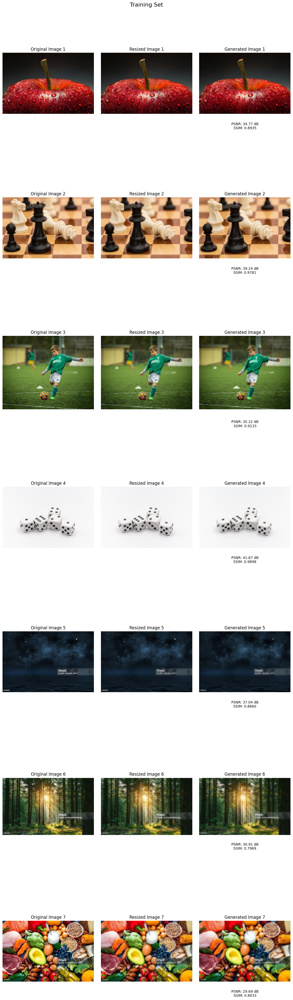

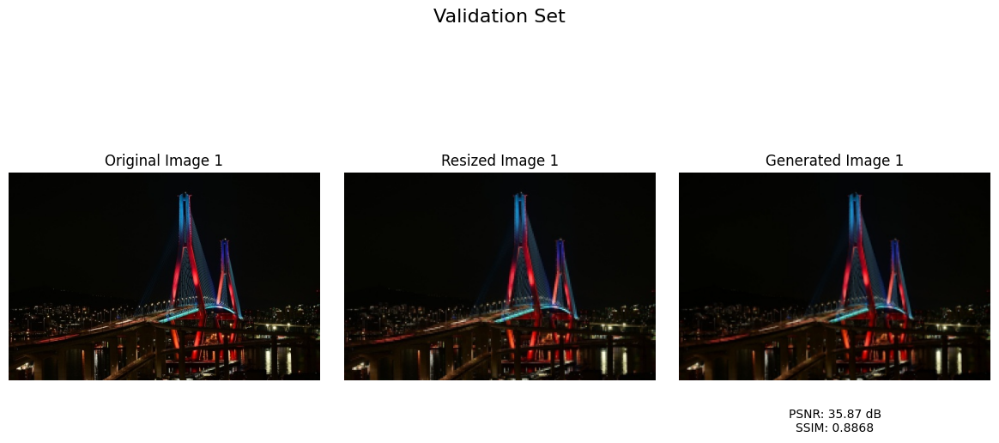

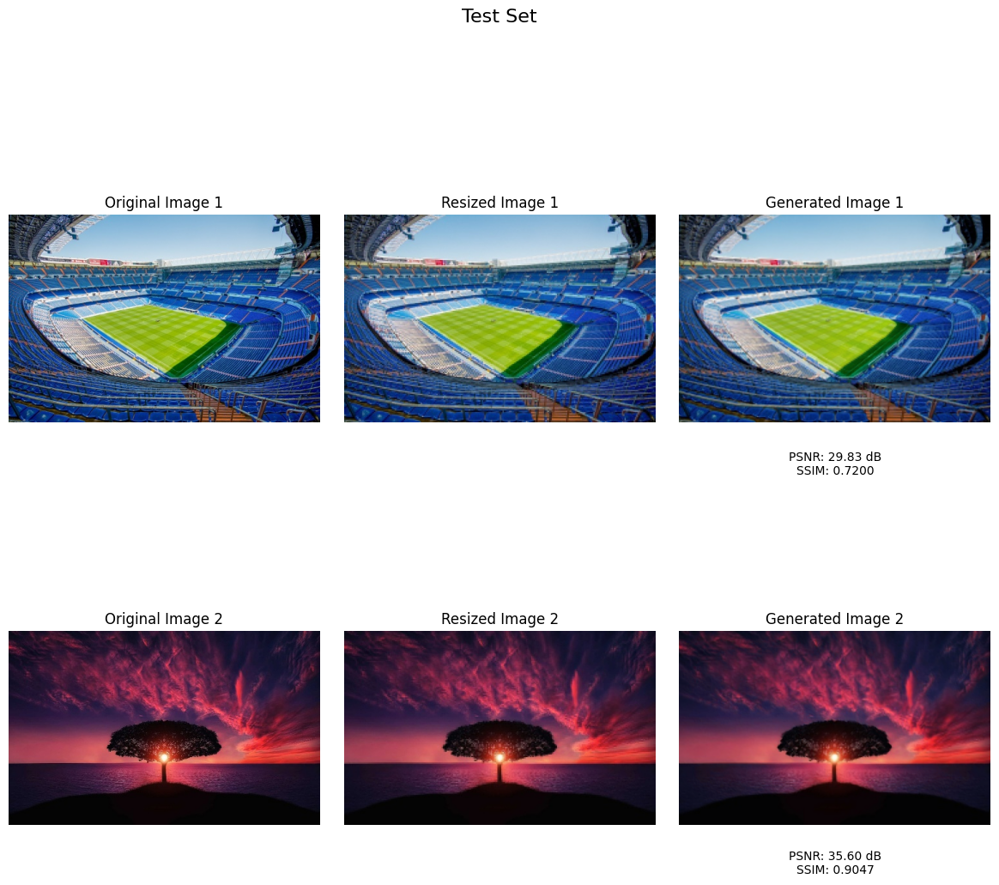

In [52]:
sets = [
    ("Training Set", original_images_training, resized_images_trining, generated_images_training),
    ("Validation Set", original_images_validation, resized_images_validation, generated_images_validation),
    ("Test Set", original_images_test, resized_images_test, generated_images_test)
]

for set_name, original_images, resized_images, generated_images in sets:
    num_images = len(original_images)
    fig, axes = plt.subplots(num_images, 3, figsize=(12, 6*num_images))
    
    if num_images == 1:
        axes = axes.reshape(1, -1)
    
    fig.suptitle(set_name, fontsize=16)
    
    for i in range(num_images):
        axes[i, 0].imshow(cv2.cvtColor(original_images[i], cv2.COLOR_BGR2RGB))
        axes[i, 0].set_title(f"Original Image {i+1}")
        axes[i, 0].axis("off")
        
        axes[i, 1].imshow(cv2.cvtColor(resized_images[i], cv2.COLOR_BGR2RGB))
        axes[i, 1].set_title(f"Resized Image {i+1}")
        axes[i, 1].axis("off")
        
        axes[i, 2].imshow(cv2.cvtColor(generated_images[i], cv2.COLOR_BGR2RGB))
        axes[i, 2].set_title(f"Generated Image {i+1}")
        axes[i, 2].axis("off")
        
        # Calculate the PSNR values
        psnr_generated_image = psnr_calc(original_images[i], generated_images[i])
        
        # Calculate the SSIM values
        ssim_generated = ssim_calc(original_images[i], generated_images[i])
        
        axes[i, 2].text(0.5, -0.2, f"PSNR: {psnr_generated_image:.2f} dB\nSSIM: {ssim_generated:.4f}",
                        ha='center', va='center', transform=axes[i, 2].transAxes, fontsize=10)
    
    plt.tight_layout(pad=2.0)
    plt.show()

# Part 4 

case 1

In [33]:
original_images_training2 = [cv2.imread(f"init_images/image_{i}.jpg") for i in range(1, 8)]
resized_images_trining2 = [cv2.imread(f"double_reduced_resolution_images/image_{i}.jpg") for i in range(1, 8)]

original_images_validation2 = [cv2.imread(f"init_images/image_{i}.jpg") for i in range(8, 9)]
resized_images_validation2 = [cv2.imread(f"double_reduced_resolution_images/image_{i}.jpg") for i in range(8, 9)]

original_images_test2 = [cv2.imread(f"init_images/image_{i}.jpg") for i in range(9, 11)]
resized_images_test2 = [cv2.imread(f"double_reduced_resolution_images/image_{i}.jpg") for i in range(9, 11)]

train_inputs, train_labels = main_data_preprocessing(original_images_training2, resized_images_trining2)
val_inputs, val_labels = main_data_preprocessing(original_images_validation2, resized_images_validation2)
test_inputs, test_labels = main_data_preprocessing(original_images_test2, resized_images_test2)

print(f"Number of input vectors: {len(train_inputs)}")
print(f"Number of label vectors: {len(train_labels)}")

Number of input vectors: 773600
Number of label vectors: 773600


In [54]:
import os
generated_images_training_1x = []
i = 0
for original_image, resized_image in zip(original_images_training2, resized_images_trining2):
    i += 1
    generated_image = generate_image(multi_layer_perceptron4, original_image, resized_image, str(i), folder_path = "generated_images_part_d_case_1")
    generated_images_training_1x.append(generated_image)

generated_images_validation_1x = []
for original_image, resized_image in zip(original_images_validation2, resized_images_validation2):
    i += 1
    generated_image = generate_image(multi_layer_perceptron4, original_image, resized_image, str(i), folder_path = "generated_images_part_d_case_1")
    generated_images_validation_1x.append(generated_image)

generated_images_test_1x = []
for original_image, resized_image in zip(original_images_test2, resized_images_test2):
    i += 1
    generated_image = generate_image(multi_layer_perceptron4, original_image, resized_image, str(i), folder_path = "generated_images_part_d_case_1")
    generated_images_test_1x.append(generated_image)

4470/4470 [==============================] - 8s 2ms/step


In [55]:
generated_images_training_2x = []
i = 0
for original_image, resized_image in zip(original_images_training2, generated_images_training_1x):
    i += 1
    generated_image = generate_image(multi_layer_perceptron4, original_image, resized_image, str(i), folder_path = "generated_images_part_d_case_1")
    generated_images_training_2x.append(generated_image)

generated_images_validation_2x = []
for original_image, resized_image in zip(original_images_validation, generated_images_validation_1x):
    i += 1
    generated_image = generate_image(multi_layer_perceptron4, original_image, resized_image, str(i), folder_path = "generated_images_part_d_case_1")
    generated_images_validation_2x.append(generated_image)

generated_images_test_2x = []
for original_image, resized_image in zip(original_images_test, generated_images_test_1x):
    i += 1
    generated_image = generate_image(multi_layer_perceptron4, original_image, resized_image, str(i), folder_path = "generated_images_part_d_case_1")
    generated_images_test_2x.append(generated_image)

4470/4470 [==============================] - 8s 2ms/step


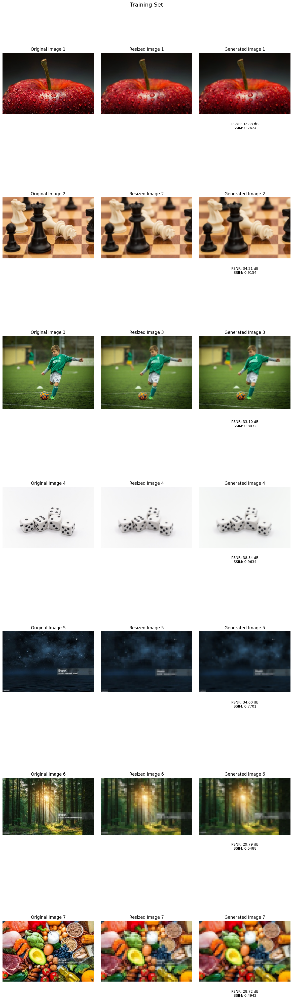

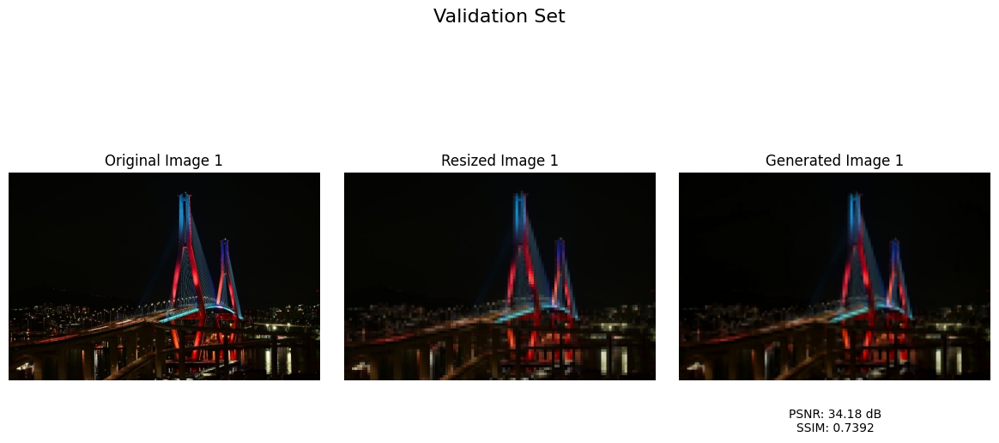

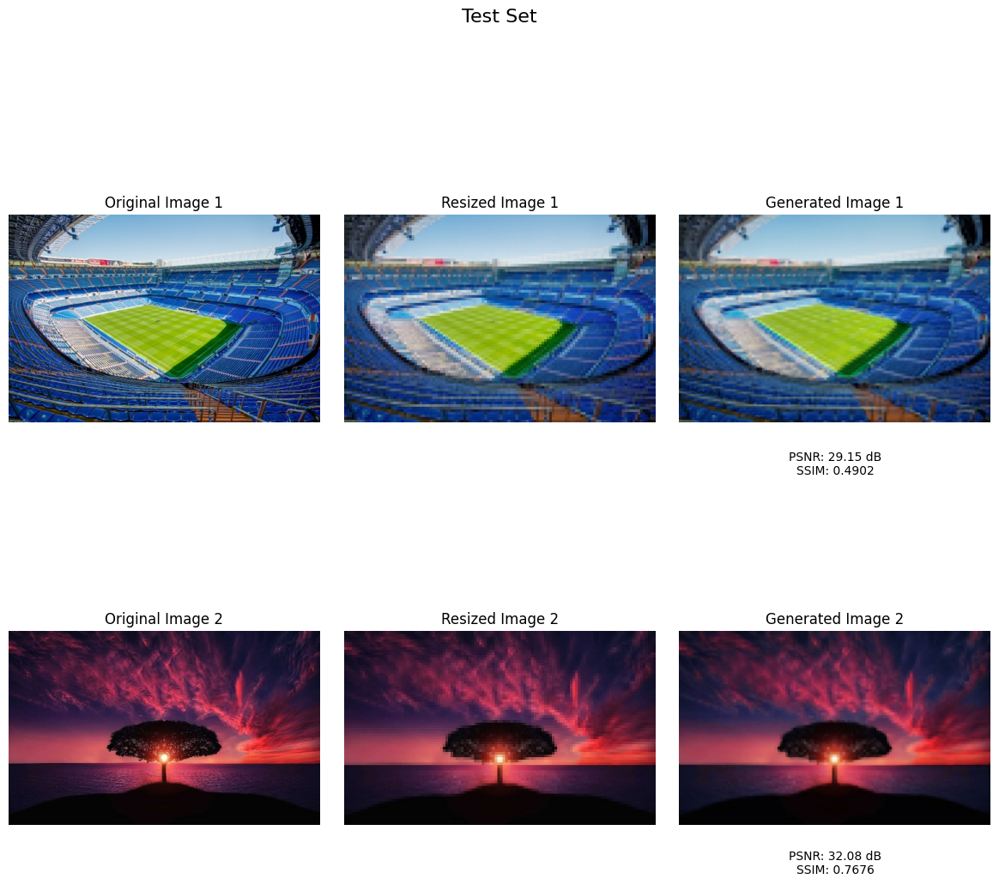

In [56]:
sets = [
    ("Training Set", original_images_training2, resized_images_trining2, generated_images_training_2x),
    ("Validation Set", original_images_validation2, resized_images_validation2, generated_images_validation_2x),
    ("Test Set", original_images_test2, resized_images_test2, generated_images_test_2x)
]

for set_name, original_images, resized_images, generated_images in sets:
    num_images = len(original_images)
    fig, axes = plt.subplots(num_images, 3, figsize=(12, 6*num_images))
    
    if num_images == 1:
        axes = axes.reshape(1, -1)
    
    fig.suptitle(set_name, fontsize=16)
    
    for i in range(num_images):
        axes[i, 0].imshow(cv2.cvtColor(original_images[i], cv2.COLOR_BGR2RGB))
        axes[i, 0].set_title(f"Original Image {i+1}")
        axes[i, 0].axis("off")
        
        axes[i, 1].imshow(cv2.cvtColor(resized_images[i], cv2.COLOR_BGR2RGB))
        axes[i, 1].set_title(f"Resized Image {i+1}")
        axes[i, 1].axis("off")
        
        axes[i, 2].imshow(cv2.cvtColor(generated_images[i], cv2.COLOR_BGR2RGB))
        axes[i, 2].set_title(f"Generated Image {i+1}")
        axes[i, 2].axis("off")
        
        # Calculate the PSNR values
        psnr_generated_image = psnr_calc(original_images[i], generated_images[i])
        
        # Calculate the SSIM values
        ssim_generated = ssim_calc(original_images[i], generated_images[i])
        
        axes[i, 2].text(0.5, -0.2, f"PSNR: {psnr_generated_image:.2f} dB\nSSIM: {ssim_generated:.4f}",
                        ha='center', va='center', transform=axes[i, 2].transAxes, fontsize=10)
    
    plt.tight_layout(pad=2.0)
    plt.show()

case 2

In [57]:
import tensorflow as tf
def content_loss(y_true, y_pred):
    y_true = tf.cast(y_true, dtype=tf.float32)
    return tf.reduce_mean(tf.sqrt(tf.reduce_sum(tf.square(y_true - y_pred), axis=-1)))

multi_layer_perceptron5 = tf.keras.models.Sequential([
    tf.keras.layers.Dense(64, activation='relu', input_shape=(27,)),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(3, activation='linear')
])

multi_layer_perceptron5.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                               loss=content_loss,
                               metrics=['mean_absolute_error'])
multi_layer_perceptron5.summary()


train_inputs = np.array(train_inputs)
train_labels = np.array(train_labels)
train_inputs = train_inputs.reshape(-1, 27)
train_labels = train_labels.reshape(-1, 3)

print("Shape of reshaped train_inputs:", train_inputs.shape)
print("Shape of reshaped train_labels:", train_labels.shape)

val_inputs = np.array(val_inputs)
val_labels = np.array(val_labels)
val_inputs = val_inputs.reshape(-1, 27)
val_labels = val_labels.reshape(-1, 3)

print("Shape of reshaped val_inputs:", val_inputs.shape)
print("Shape of reshaped val_labels:", val_labels.shape)

batch_size = 1000
epochs = 50
multi_layer_perceptron5.fit(train_inputs, train_labels, batch_size=batch_size, epochs=epochs)

# Evaluate the model on the validation set
val_loss, val_mae = multi_layer_perceptron5.evaluate(val_inputs, val_labels)

print("Validation Content Loss:", val_loss)
print("Validation MAE:", val_mae)

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_18 (Dense)            (None, 64)                1792      
                                                                 
 dense_19 (Dense)            (None, 32)                2080      
                                                                 
 dense_20 (Dense)            (None, 3)                 99        
                                                                 
Total params: 3,971
Trainable params: 3,971
Non-trainable params: 0
_________________________________________________________________


Shape of reshaped train_inputs: (773600, 27)
Shape of reshaped train_labels: (773600, 3)
Shape of reshaped val_inputs: (153600, 27)
Shape of reshaped val_labels: (153600, 3)
Epoch 1/50
774/774 [==============================] - 7s 8ms/step - loss: 14.1240 - mean_absolute_error: 7.6411
Epoch 2/50
774/774 [==============================] - 4s 6ms/step - loss: 12.0593 - mean_absolute_error: 6.5871
Epoch 3/50
774/774 [==============================] - 4s 5ms/step - loss: 11.8920 - mean_absolute_error: 6.5059
Epoch 4/50
774/774 [==============================] - 4s 5ms/step - loss: 11.8082 - mean_absolute_error: 6.4643
Epoch 5/50
774/774 [==============================] - 4s 5ms/step - loss: 11.7251 - mean_absolute_error: 6.4239
Epoch 6/50
774/774 [==============================] - 4s 5ms/step - loss: 11.6779 - mean_absolute_error: 6.3979
Epoch 7/50
774/774 [==============================] - 4s 5ms/step - loss: 11.6213 - mean_absolute_error: 6.3714
Epoch 8/50
774/774 [======================

In [58]:
generated_images_training = []
i = 0
for original_image, resized_image in zip(original_images_training2, resized_images_trining2):
    i += 1
    generated_image = generate_image(multi_layer_perceptron5, original_image, resized_image, str(i), folder_path = "generated_images_part_d_case_2")
    generated_images_training.append(generated_image)

generated_images_validation = []
for original_image, resized_image in zip(original_images_validation2, resized_images_validation2):
    i += 1
    generated_image = generate_image(multi_layer_perceptron5, original_image, resized_image, str(i), folder_path = "generated_images_part_d_case_2")
    generated_images_validation.append(generated_image)

generated_images_test = []
for original_image, resized_image in zip(original_images_test2, resized_images_test2):
    i += 1
    generated_image = generate_image(multi_layer_perceptron5, original_image, resized_image, str(i), folder_path = "generated_images_part_d_case_2")
    generated_images_test.append(generated_image)

4470/4470 [==============================] - 8s 2ms/step


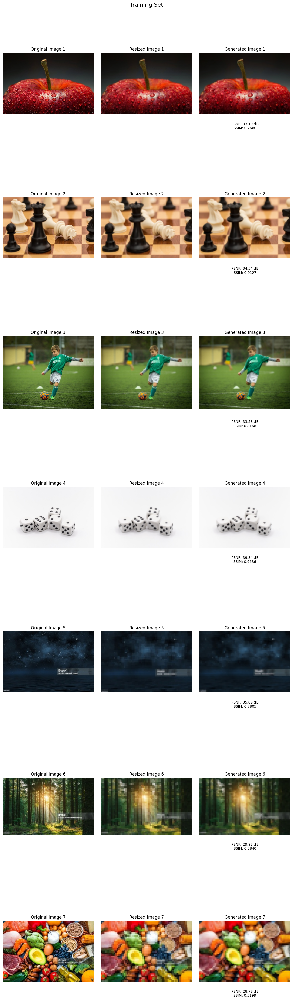

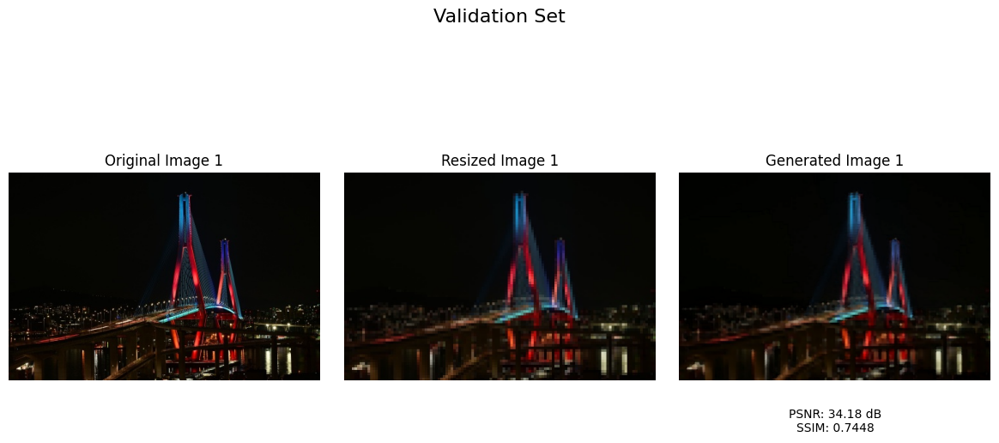

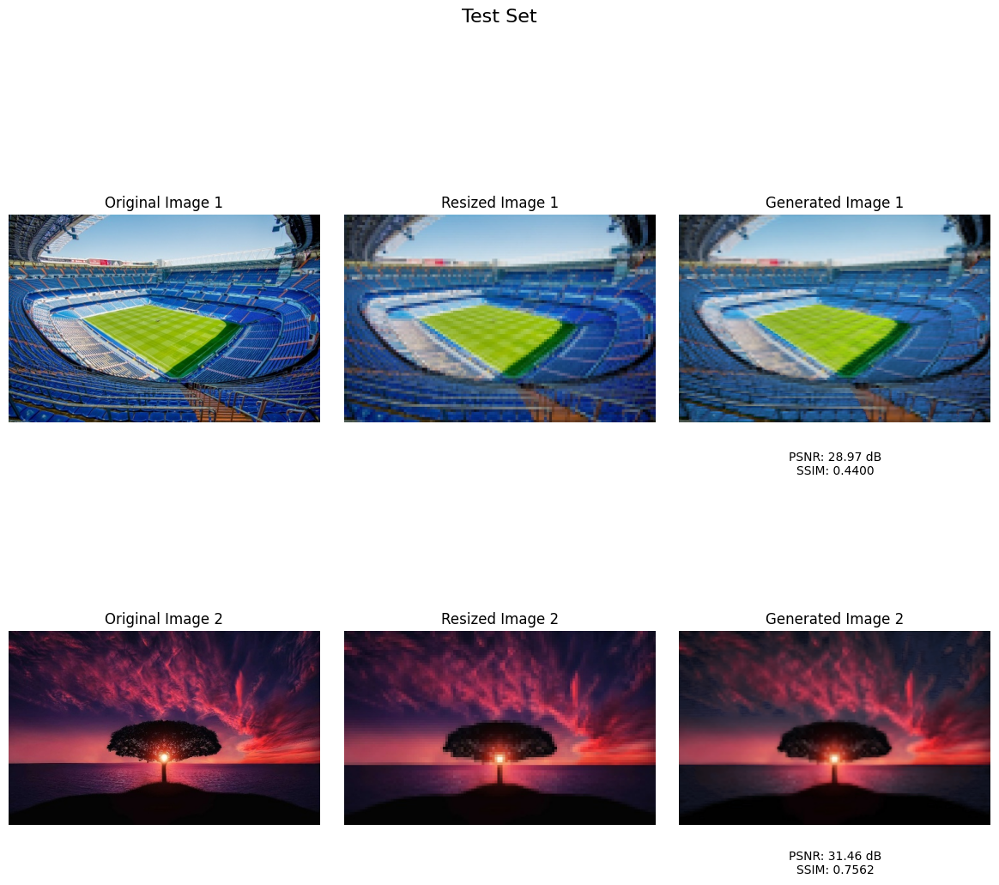

In [59]:
sets = [
    ("Training Set", original_images_training2, resized_images_trining2, generated_images_training),
    ("Validation Set", original_images_validation2, resized_images_validation2, generated_images_validation),
    ("Test Set", original_images_test2, resized_images_test2, generated_images_test)
]

for set_name, original_images, resized_images, generated_images in sets:
    num_images = len(original_images)
    fig, axes = plt.subplots(num_images, 3, figsize=(12, 6*num_images))
    
    if num_images == 1:
        axes = axes.reshape(1, -1)
    
    fig.suptitle(set_name, fontsize=16)
    
    for i in range(num_images):
        axes[i, 0].imshow(cv2.cvtColor(original_images[i], cv2.COLOR_BGR2RGB))
        axes[i, 0].set_title(f"Original Image {i+1}")
        axes[i, 0].axis("off")
        
        axes[i, 1].imshow(cv2.cvtColor(resized_images[i], cv2.COLOR_BGR2RGB))
        axes[i, 1].set_title(f"Resized Image {i+1}")
        axes[i, 1].axis("off")
        
        axes[i, 2].imshow(cv2.cvtColor(generated_images[i], cv2.COLOR_BGR2RGB))
        axes[i, 2].set_title(f"Generated Image {i+1}")
        axes[i, 2].axis("off")
        
        # Calculate the PSNR values
        psnr_generated_image = psnr_calc(original_images[i], generated_images[i])
        
        # Calculate the SSIM values
        ssim_generated = ssim_calc(original_images[i], generated_images[i])
        
        axes[i, 2].text(0.5, -0.2, f"PSNR: {psnr_generated_image:.2f} dB\nSSIM: {ssim_generated:.4f}",
                        ha='center', va='center', transform=axes[i, 2].transAxes, fontsize=10)
    
    plt.tight_layout(pad=2.0)
    plt.show()

case 3 

In [34]:
import tensorflow as tf
def content_loss(y_true, y_pred):
    y_true = tf.cast(y_true, dtype=tf.float32)
    return tf.reduce_mean(tf.sqrt(tf.reduce_sum(tf.square(y_true - y_pred), axis=-1)))

multi_layer_perceptron6 = tf.keras.models.Sequential([
    tf.keras.layers.Dense(48, activation='relu', input_shape=(27,)),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(3, activation='linear'),
    tf.keras.layers.Dense(48, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(3, activation='linear')
])

multi_layer_perceptron6.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                               loss=content_loss,
                               metrics=['mean_absolute_error'])
multi_layer_perceptron6.summary()


train_inputs = np.array(train_inputs)
train_labels = np.array(train_labels)
train_inputs = train_inputs.reshape(-1, 27)
train_labels = train_labels.reshape(-1, 3)

print("Shape of reshaped train_inputs:", train_inputs.shape)
print("Shape of reshaped train_labels:", train_labels.shape)

val_inputs = np.array(val_inputs)
val_labels = np.array(val_labels)
val_inputs = val_inputs.reshape(-1, 27)
val_labels = val_labels.reshape(-1, 3)

print("Shape of reshaped val_inputs:", val_inputs.shape)
print("Shape of reshaped val_labels:", val_labels.shape)

batch_size = 1000
epochs = 100
multi_layer_perceptron6.fit(train_inputs, train_labels, batch_size=batch_size, epochs=epochs)

# Evaluate the model on the validation set
val_loss, val_mae = multi_layer_perceptron6.evaluate(val_inputs, val_labels)

print("Validation Content Loss:", val_loss)
print("Validation MAE:", val_mae)

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_25 (Dense)            (None, 38)                1064      
                                                                 
 dense_26 (Dense)            (None, 32)                1248      
                                                                 
 dense_27 (Dense)            (None, 3)                 99        
                                                                 
 dense_28 (Dense)            (None, 38)                152       
                                                                 
 dense_29 (Dense)            (None, 32)                1248      
                                                                 
 dense_30 (Dense)            (None, 3)                 99        
                                                                 
Total params: 3,910
Trainable params: 3,910
Non-traina

In [35]:
generated_images_training = []
i = 0
for original_image, resized_image in zip(original_images_training2, resized_images_trining2):
    i += 1
    generated_image = generate_image(multi_layer_perceptron6, original_image, resized_image, str(i), folder_path = "generated_images_part_d_case_3")
    generated_images_training.append(generated_image)

generated_images_validation = []
for original_image, resized_image in zip(original_images_validation2, resized_images_validation2):
    i += 1
    generated_image = generate_image(multi_layer_perceptron6, original_image, resized_image, str(i), folder_path = "generated_images_part_d_case_3")
    generated_images_validation.append(generated_image)

generated_images_test = []
for original_image, resized_image in zip(original_images_test2, resized_images_test2):
    i += 1
    generated_image = generate_image(multi_layer_perceptron6, original_image, resized_image, str(i), folder_path = "generated_images_part_d_case_3")
    generated_images_test.append(generated_image)

4470/4470 [==============================] - 9s 2ms/step


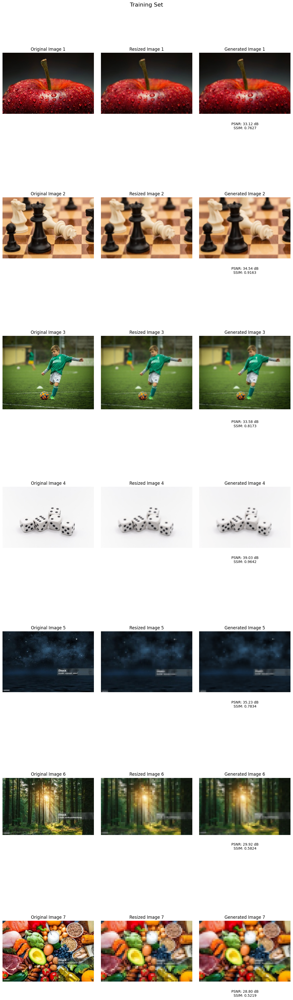

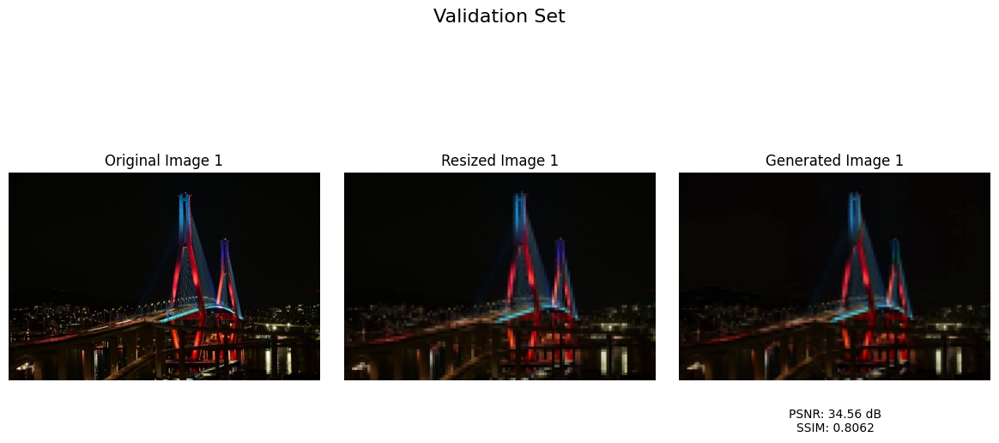

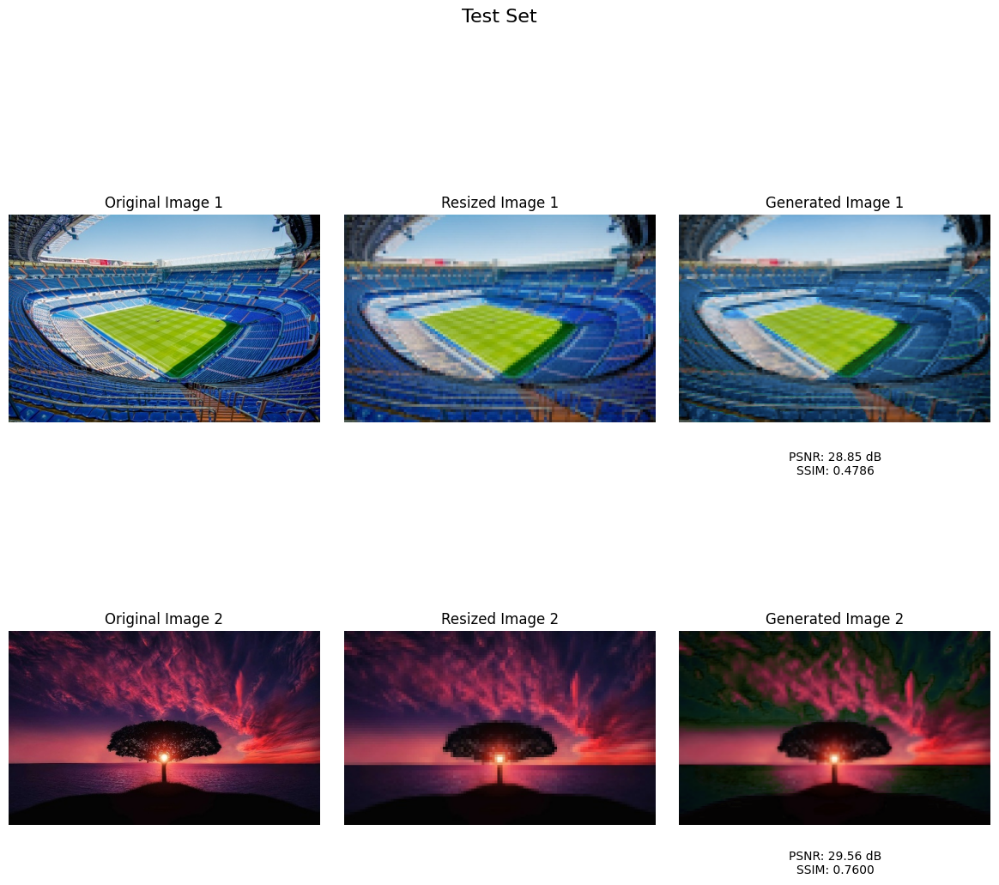

In [36]:
sets = [
    ("Training Set", original_images_training2, resized_images_trining2, generated_images_training),
    ("Validation Set", original_images_validation2, resized_images_validation2, generated_images_validation),
    ("Test Set", original_images_test2, resized_images_test2, generated_images_test)
]

for set_name, original_images, resized_images, generated_images in sets:
    num_images = len(original_images)
    fig, axes = plt.subplots(num_images, 3, figsize=(12, 6*num_images))
    
    if num_images == 1:
        axes = axes.reshape(1, -1)
    
    fig.suptitle(set_name, fontsize=16)
    
    for i in range(num_images):
        axes[i, 0].imshow(cv2.cvtColor(original_images[i], cv2.COLOR_BGR2RGB))
        axes[i, 0].set_title(f"Original Image {i+1}")
        axes[i, 0].axis("off")
        
        axes[i, 1].imshow(cv2.cvtColor(resized_images[i], cv2.COLOR_BGR2RGB))
        axes[i, 1].set_title(f"Resized Image {i+1}")
        axes[i, 1].axis("off")
        
        axes[i, 2].imshow(cv2.cvtColor(generated_images[i], cv2.COLOR_BGR2RGB))
        axes[i, 2].set_title(f"Generated Image {i+1}")
        axes[i, 2].axis("off")
        
        # Calculate the PSNR values
        psnr_generated_image = psnr_calc(original_images[i], generated_images[i])
        
        # Calculate the SSIM values
        ssim_generated = ssim_calc(original_images[i], generated_images[i])
        
        axes[i, 2].text(0.5, -0.2, f"PSNR: {psnr_generated_image:.2f} dB\nSSIM: {ssim_generated:.4f}",
                        ha='center', va='center', transform=axes[i, 2].transAxes, fontsize=10)
    
    plt.tight_layout(pad=2.0)
    plt.show()